# Landsat 8 glacier albedo

## Set up

### Get glacier polygons

In [1]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# load data and join bounds
df = gpd.read_file("data/02_rgi60_WesternCanadaUS.shp")
df = pd.concat([df, df.bounds], axis=1)

# print(df.crs)
# plt.figure(figsize=(10,10))
# df.plot(ax=plt.gca())

### Environment setup

This notebook works with or without an API key, but you will be given more permissive access to the data with an API key.
The [Planetary Computer Hub](https://planetarycomputer.microsoft.com/compute) is pre-configured to use your API key.

In [2]:
from pystac_client import Client
from pystac.extensions.eo import EOExtension as eo
import planetary_computer as pc

import numpy as np
import xarray as xr

import rasterio.features
import stackstac
import pystac_client
import planetary_computer

import xrspatial.multispectral as ms

from dask_gateway import GatewayCluster

# Set the environment variable PC_SDK_SUBSCRIPTION_KEY, or set it here.
# The Hub sets PC_SDK_SUBSCRIPTION_KEY automatically.
# pc.settings.set_subscription_key(<YOUR API Key>)

### Create a Dask cluster

We're going to process a large amount of data. To cut down on the execution time, we'll use a Dask cluster to do the computation in parallel, adaptively scaling to add and remove workers as needed. See [Scale With Dask](../quickstarts/scale-with-dask.ipynb) for more on using Dask.

In [3]:
cluster = GatewayCluster()  # Creates the Dask Scheduler. Might take a minute.

client = cluster.get_client()

cluster.adapt(minimum=4, maximum=24)
print(cluster.dashboard_link)

https://pccompute.westeurope.cloudapp.azure.com/compute/services/dask-gateway/clusters/prod.9a8055401e0445b491a0e2b309b2da5d/status


### Convert polygons to AOIs

In [4]:
# Let's start with large polygons
df['area'] = df.area
df = df.sort_values('area', ascending=False).reset_index(drop=True)

/tmp/ipykernel_1149/1720519345.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'area' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  df['area'] = df.area


In [5]:
def poly2aoi(poly):
    aoi = {
    "type": "Polygon",
    "coordinates": [list(poly.exterior.coords)],
}
    return aoi

def bounds2xxyy(bounds):
    xx = bounds[slice(0,3,2)]
    yy = bounds[slice(1,4,2)]
    return xx, yy

## Collect and mask stack

### STAC search

In [6]:
time_of_interest = "2010-01-01/2021-12-31"
poly = df.geometry.iloc[0]
area_of_interest = poly2aoi(poly)

In [7]:
# Submit search
catalog = Client.open("https://planetarycomputer.microsoft.com/api/stac/v1")

search = catalog.search(
    collections=["landsat-8-c2-l2"],
    intersects=area_of_interest,
    datetime=time_of_interest,
    limit=500,  # fetch items in batches of 500
#     query={"eo:cloud_cover": {"lt": 25}},
)

# Check how many items were returned
items = list(search.get_items())
print(f"Returned {len(items)} Items")

Returned 483 Items


In [8]:
%%time
# Sign items to be submitted to the PC
signed_items = []
for item in items:
    item.clear_links()
    signed_items.append(pc.sign(item).to_dict())

CPU times: user 579 ms, sys: 0 ns, total: 579 ms
Wall time: 913 ms


In [9]:
# surface reflectance stack
bands_sr = [f"SR_B{i}" for i in range(1,8)]

da_sr = (
    stackstac.stack(
        signed_items,
        epsg=32610,
        assets=bands_sr,
#         assets=["SR_B4", "SR_B3", "SR_B2"],
        chunksize=4096,
        resolution=30,
        bounds_latlon=poly.bounds
    )
#     .where(lambda x: x != -32768, other=np.nan)  
    # sentinel-2 uses 0 as nodata, l8 -32768
#     .assign_coords(band=lambda x: x.common_name.rename("band"))  # use common names
)
# da_sr

In [10]:
# distance to cloud stack
da_cld = (
    stackstac.stack(
        signed_items,
        epsg=32610,
        assets=["ST_CDIST"],
        chunksize=4096,
#         resolution=30,
        bounds_latlon=poly.bounds
    )
#     .where(lambda x: x != -32768, other=np.nan)  
    # sentinel-2 uses 0 as nodata, l8 -32768
#     .assign_coords(band=lambda x: x.common_name.rename("band"))  # use common names
)
# da_cld

In [11]:
# surface temperature stack
da_st = (
    stackstac.stack(
        signed_items,
        epsg=3269,
        assets=["ST_B10"],
        chunksize=4096,
#         resolution=100,
        bounds_latlon=poly.bounds
    )
#     .where(lambda x: x != -32768, other=np.nan)  
    # sentinel-2 uses 0 as nodata, l8 -32768
#     .assign_coords(band=lambda x: x.common_name.rename("band"))  # use common names
)
# da_st

In [15]:
%%time
# persist dataset in memory for speed (check array size above is less than memory at bottom of page)
# sometimes this doesn't do anything...
da_sr = da_sr.persist()
da_cld = da_cld.persist()
da_st = da_st.persist()

CPU times: user 242 ms, sys: 41 ms, total: 283 ms
Wall time: 241 ms


### Mask by glacier polygon

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
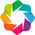

In [16]:
import rasterio as rio
from pyproj import Transformer
from shapely.geometry import Polygon
from shapely.ops import transform
import matplotlib
import holoviews as hv
import hvplot.xarray
hv.extension('bokeh')

In [17]:
# transform polygon to match imagery crs
project = Transformer.from_crs("epsg:4326", da_sr.crs, always_xy=True).transform
poly_imgcrs = transform(project, poly)

# xs, ys = transformer.transform(*poly.exterior.coords.xy)
# poly_imgcrs = Polygon(zip(xs, ys))

In [18]:
# create mask from polygon
mask_glacier = rio.features.geometry_mask([poly_imgcrs],
                                      out_shape=(len(da_sr.y), len(da_sr.x)),
                                      transform=da_sr.transform,
                                      invert=True)

mask_glacier = xr.DataArray(mask_glacier , dims=("y", "x"))
# mask_glacier.plot()

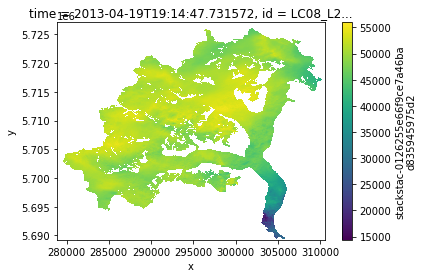

In [19]:
da_sr.isel(time=0, band=0).where(mask_glacier==True).plot()

## Atmospheric correction?

Improved dark object subtraction algorithm (Chavez, 1996)? Or is C2L2 data already atmospherically corrected...

## Cloud and cloud shadow detection

Pixel-stack statistics to detect clouds and their shadows.

Temperature is best identifier but this not available for Sentinel2. 

1. Find cloudy signature in time series 
    - Over glacier snow will be hardest for clouds
    - Not sure about cloud shadows
    - How about thin cloud?
2. Try band combination
    - Can differentiate by day/month of year (find consistent response vs. changing response)
3. Try PCA + cutoff/clustering
4. Try training on Landsat cloud mask?
    - Can results be applied to S2 bands?
5. Hand labelling training set

In [76]:
# parameters for testing
x = 305000 # epsg:32610
y = 5723000
hw = 5000
project_st = Transformer.from_crs(da_sr.crs, da_st.crs, always_xy=True).transform
x_st, y_st = project_st(x, y)

t_test = ["2018-08-23 19:12:29", "2017-06-17 19:12:43", "2015-10-18 19:13:01", "2015-11-19 19:13:08", 
          "2016-01-22 19:13:05", "2016-03-26 19:12:42", "2016-01-06 19:13:03", "2014-01-16 19:14:08",
         "2014-08-28 19:13:04", "2014-09-29 19:13:08"]

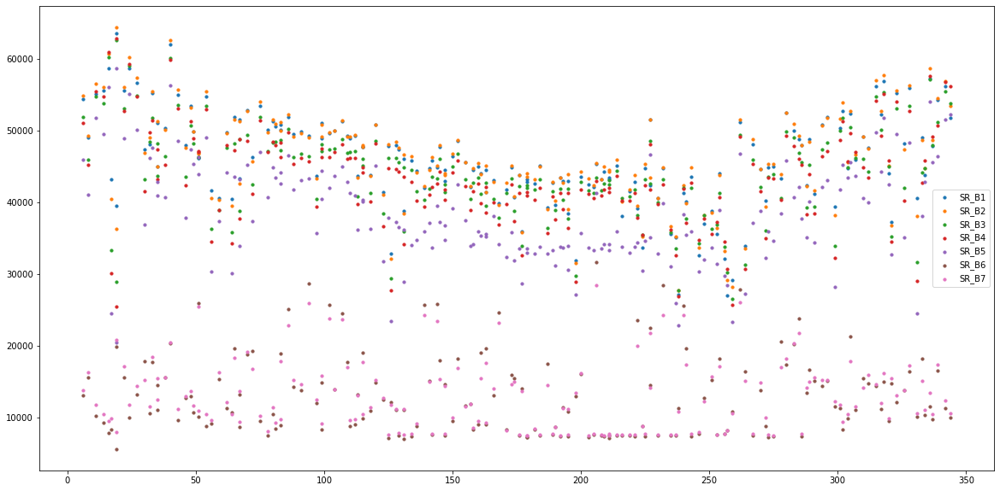

In [42]:
plt.figure(figsize=(20,10))
for band in da_sr.band:
    plt.scatter(da_sr.coords['time'].dt.dayofyear, da_sr.sel(band=band).sel(x=x, y=y, method="nearest"),
               s=10, label=str(band.data))

plt.legend()
plt.show()

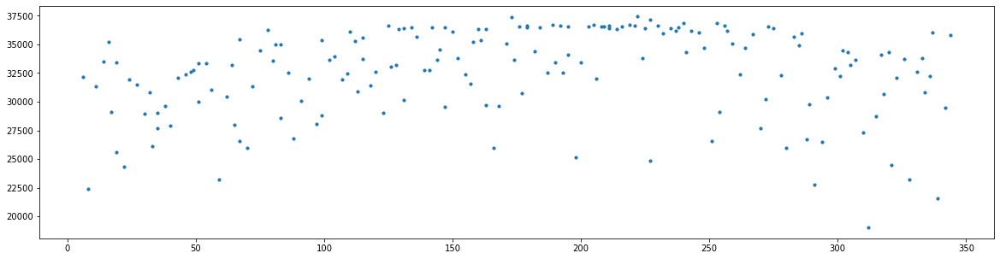

CPU times: user 440 ms, sys: 143 ms, total: 583 ms
Wall time: 340 ms


In [90]:
%%time
# surface temp
st_ts = da_st.sel(x=x_st, y=y_st, method="nearest")
plt.figure(figsize=(20,5))
plt.scatter(da_st.coords['time'].dt.dayofyear, st_ts, s=10)
plt.show()

SR_B1   -0.268793
SR_B2   -0.229348
SR_B3   -0.162976
SR_B4   -0.147863
SR_B5   -0.291075
SR_B6   -0.386961
SR_B7   -0.483951
dtype: float64
max corr: SR_B7


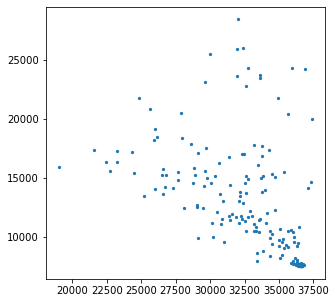

CPU times: user 1.03 s, sys: 155 ms, total: 1.18 s
Wall time: 935 ms


In [135]:
%%time
# investigate surface temp correlation with bands
import pandas as pd
from scipy.stats import pearsonr

band2ts = lambda band: da_sr.sel(band=band).sel(x=x, y=y, method="nearest").values

corrs = pd.Series({str(band.data): pearsonr(*pd.DataFrame([st_ts.values[:,0], band2ts(band)]).T.dropna().T.values)[0] for band in da_sr.band})
corrs_maxband = corrs.abs().idxmax()
print(corrs)
print(f"max corr: {corrs_maxband}")

plt.figure(figsize=(5,5))
plt.scatter(st_ts, band2ts(corrs_maxband), s=5)
plt.show()

In [127]:
# browse test area and times
da_sub = da_sr.sel(x=slice(x-hw,x+hw), y=slice(y+hw,y-hw)).sel(time=t_test, method="nearest")
da_br = da_sub.sel(band="SR_B6") / da_sub.sel(band="SR_B1")

In [ ]:
da_cld.sel(x=slice(x-hw,x+hw), y=slice(y+hw,y-hw)).sel(time=t_test, method="nearest").hvplot.image(frame_width=400, frame_height=400, cmap='viridis_r', clim=(0,100))

In [163]:
(da_sub.sel(band=["SR_B3","SR_B2","SR_B1"])/da_sub.max()).hvplot.rgb(x='x', y='y', bands='band', frame_width=400, frame_height=400)

:DynamicMap   [time]
   :RGB   [x,y]   (R,G,B)

In [141]:
da_cld.where(da_cld>0.25).hvplot.image(clim=(0,1), frame_width=300, frame_height=300, cmap='jet')

:DynamicMap   [time]
   :Image   [y,x]   (stackstac-ba54671c291ce128e0cadd79c34218d8)

## Topographic shadows and slope mask

DEM + illumination geometry --> shadow time series

Get max shadow area mask and apply to all times to allow for consistent pixel-wise comparison

Remove slopes greater than > 45deg (crevasses, icefalls, anisotropy) (Klok et al., 2003)

## Clean glacier detection

Methods to try:
- Just use polygons
- Band ratios (one or more times of year)
- 

### Compare on glacier to off glacier time-series

In [19]:
%%time
# compute time series statistics for each band
quantiles = [0.1, 0.5, 0.9]
ts_on = da_sr.where(mask_glacier==True).quantile(quantiles, dim=("x","y")).compute()
ts_off = da_sr.where(mask_glacier==False).quantile(quantiles, dim=("x","y")).compute()

CPU times: user 2.09 s, sys: 62.2 ms, total: 2.16 s
Wall time: 8.62 s


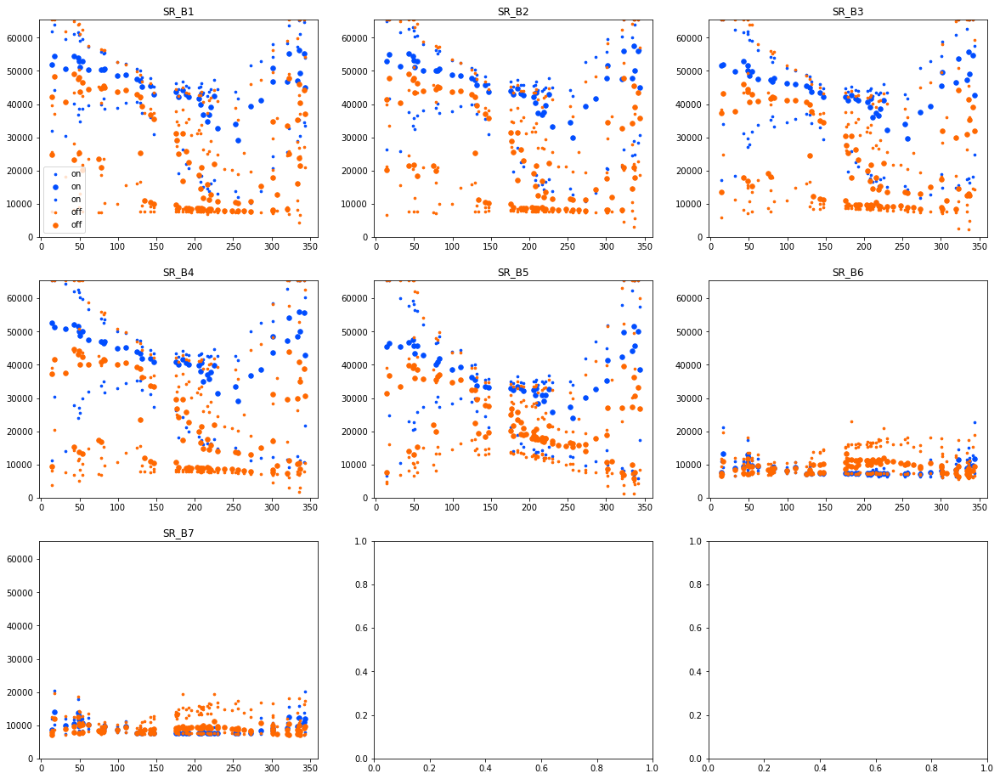

CPU times: user 1.38 s, sys: 125 ms, total: 1.5 s
Wall time: 2.22 s


In [47]:
%%time
fig, axes = plt.subplots(ncols=3, nrows=3, figsize=(20,16)) 
ylim = (0, da_sr.max().values)
cmap = matplotlib.cm.get_cmap('jet')
onoff_cs = [cmap(0.2), cmap(0.8)]
quantile_szs = [7, 30, 7]
                

for band, ax, i in zip(da_sr.coords['band'], axes.flatten(), range(len(ts.band))):
    for ts, onoff, c in zip([ts_on, ts_off], ["on", "off"], onoff_cs):
        for quantile, sz in zip(quantiles, quantile_szs):
            ax.scatter(ts.coords['time'].dt.dayofyear, ts.sel(band=band, quantile=quantile), 
                       label=onoff, color=c, s=sz)
            ax.legend() if ((i == 0) and (quantile == 0.5)) else None
        ax.set_ylim(ylim)
        ax.set_title(band.data)
        
plt.show()

### Method A: Just use polygons

In [69]:
cld_dist = 100
scaling = 2**16

da_gl = da_sr.where(mask_glacier==True).where(da_cld.isel(band=0)>cld_dist)
da_gl = da_gl.dropna("time", "all")
da_gl = da_gl / scaling

## Albedo calculation

For ETM, from Liang 2001:

$albedo = 0.35*b1 + 0.130*b3 + 0.373*b4 + 0.085*b5 + 0.072*b7 - 0.0018$

Need to convert band numbers for OLI

![](https://landsat.gsfc.nasa.gov/sites/landsat/files/2013/01/BandpassesL7vL8_Jul20131.jpg)

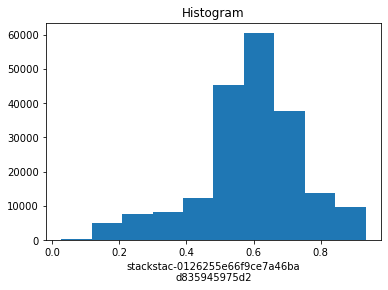

In [74]:
# calculate albedo using Liang 2001
da_al = (
    0.35 * da_gl.sel(band="SR_B2") + 
    0.130 * da_gl.sel(band="SR_B4") + 
    0.373 * da_gl.sel(band="SR_B5") + 
    0.085 * da_gl.sel(band="SR_B6") + 
    0.072 * da_gl.sel(band="SR_B7") - 
    0.0018
)
da_al.isel(x=slice(0,-1,10), y=slice(0,-1,10)).plot()
plt.show()

In [71]:
da_al.isel(x=slice(0, -1, 10), y=slice(0, -1, 10)).hvplot.image(cmap='viridis', frame_width=500, frame_height=500, groupby='time', clim=(0,1))

:DynamicMap   [time]
   :Image   [x,y]   (stackstac-0126255e66f9ce7a46bad835945975d2)

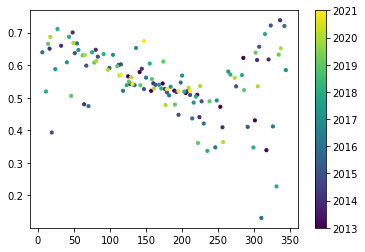

In [89]:
# median albedo throughout year
plt.scatter(da_al.coords['time'].dt.dayofyear, da_al.isel(x=slice(0,-1,10), y=slice(0,-1,10)).median(("x", "y")), c=da_al.coords['time'].dt.year, s=10)
plt.colorbar()
plt.show()

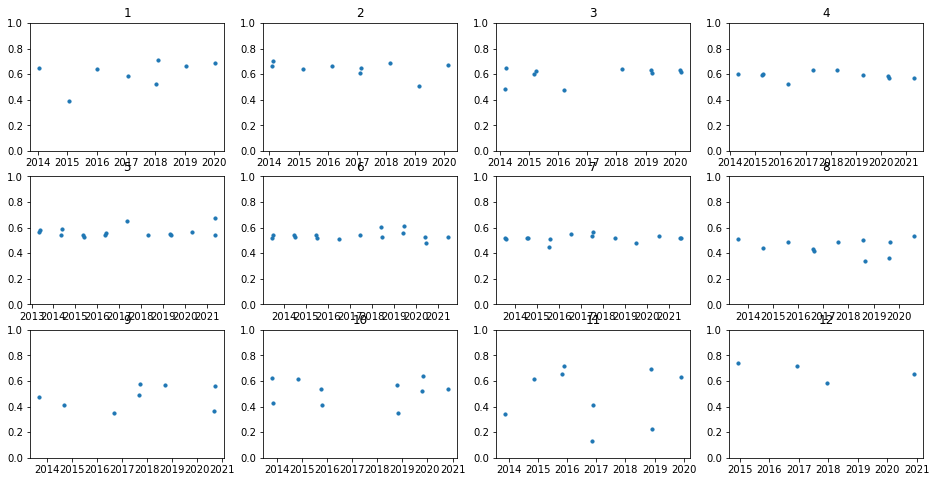

In [111]:
# monthly albedo throughout period
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(16,8))
for m, ax in zip(range(1,13), axes.flatten()):
    print(f"{m}\r", end="")
    al_ts = da_al.where(da_al.coords['time'].dt.month==m).isel(x=slice(0,-1,10), y=slice(0,-1,10)).median(("x", "y"))
    ax.scatter(pd.to_datetime(da_al.coords['time']), al_ts, s=10)
    ax.set_ylim(0,1)
    ax.set_title(m)
plt.show()

## Misc

### Median composite

Using normal xarray operations, we can [compute the median](http://xarray.pydata.org/en/stable/generated/xarray.DataArray.median.html) over the time dimension. Under the assumption that clouds are transient, the composite shouldn't contain (many) clouds, since they shouldn't be the median pixel value at that point over many images.

This will be computed in parallel on the cluster (make sure to open the Dask Dashboard using the link printed out above).

In [156]:
median = data.median(dim="time").compute()

To visualize the data, we'll use xarray-spatial's `true_color` method to convert to red/green/blue values.

In [157]:
image = ms.true_color(*median)  # expects red, green, blue DataArrays

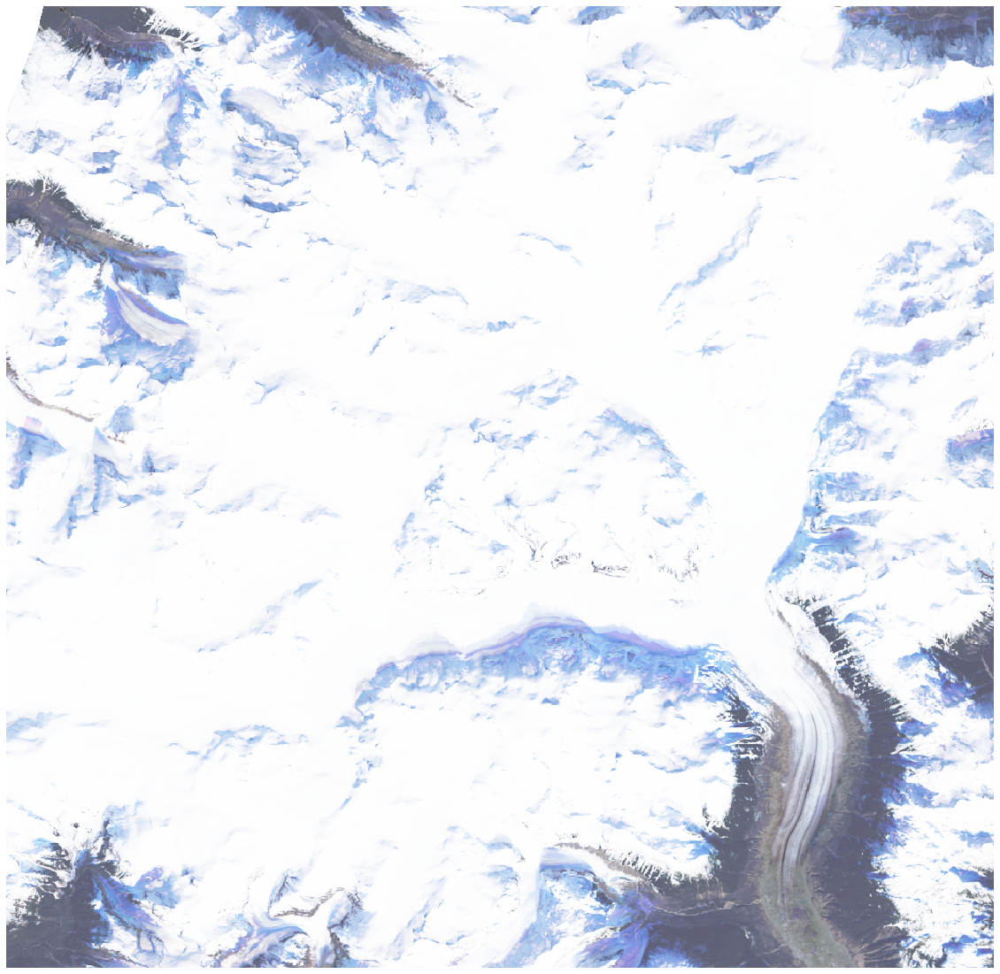

In [158]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(20, 20))

ax.set_axis_off()
image.plot.imshow(ax=ax);

### Monthly composite

Now suppose we don't want to combine images from different parts of the year (for example, we might not want to combine images from January that often include snow with images from July). Again using standard xarray syntax, we can create set of per-month composites by grouping by month and then taking the median.

In [159]:
monthly = data.groupby("time.month").median().compute()

Let's convert each of those arrays to a true-color image and plot the results as a grid.

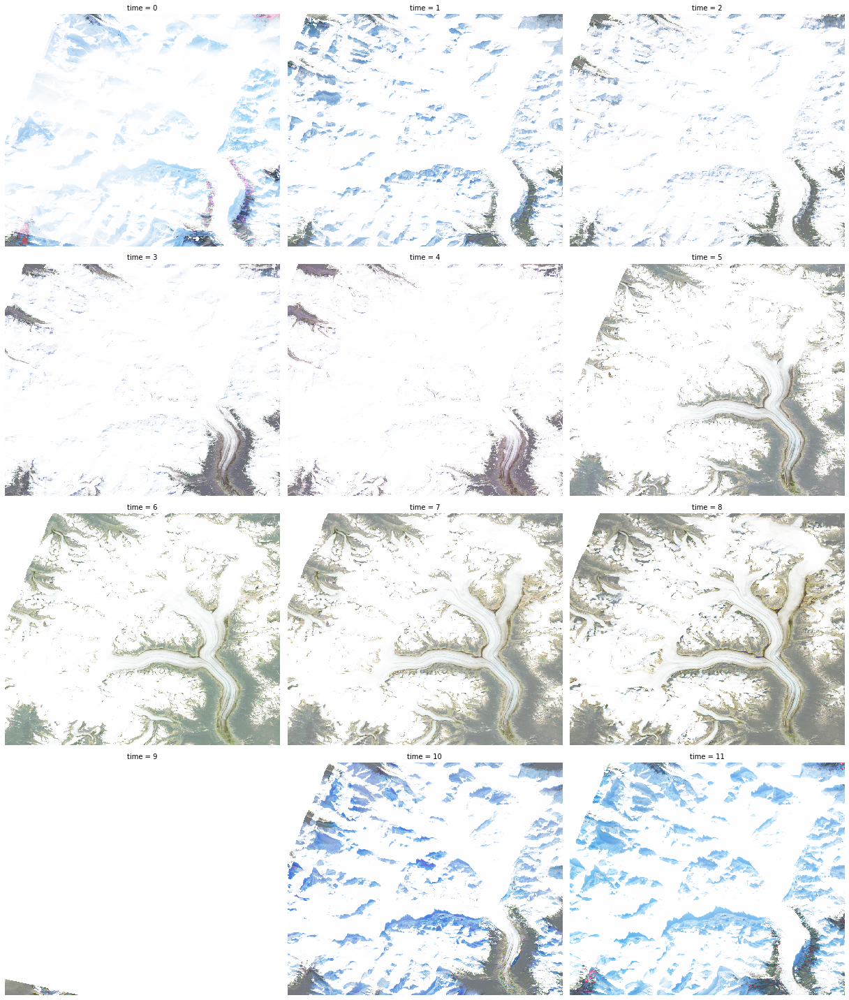

distributed.client - ERROR - Failed to reconnect to scheduler after 30.00 seconds, closing client
_GatheringFuture exception was never retrieved
future: <_GatheringFuture finished exception=CancelledError()>
asyncio.exceptions.CancelledError
Exception in callback None()
handle: <Handle cancelled>
Traceback (most recent call last):
  File "/srv/conda/envs/notebook/lib/python3.8/site-packages/tornado/iostream.py", line 1391, in _do_ssl_handshake
    self.socket.do_handshake()
  File "/srv/conda/envs/notebook/lib/python3.8/ssl.py", line 1309, in do_handshake
    self._sslobj.do_handshake()
ssl.SSLEOFError: EOF occurred in violation of protocol (_ssl.c:1131)

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/srv/conda/envs/notebook/lib/python3.8/asyncio/events.py", line 81, in _run
    self._context.run(self._callback, *self._args)
  File "/srv/conda/envs/notebook/lib/python3.8/site-packages/tornado/platform/asyncio.py", line 1

In [160]:
images = [ms.true_color(*x) for x in monthly]
images = xr.concat(images, dim="time")

g = images.plot.imshow(x="x", y="y", rgb="band", col="time", col_wrap=3, figsize=(17, 20))
for ax in g.axes.flat:
    ax.set_axis_off()

plt.tight_layout()